# GENERAL NOTES FOR THE LABORATORIES

Use the virtual env we set in our past laboratory. 

Put this script in the same folder of the virtualENV.

```pip install scikit-image```

For any doubt please ask during class or send an e-mail to the professor or the teaching assistant:

*   Andrea Montibeller: andrea.montibeller@unitn.it

# WORKING WITH IMAGES and OpenCV and Other Basics

There are several different libraries available for processing and manipulating images in Python. Among the most common we can list:

*   [scikit-image](https://scikit-image.org/) //Complex img processing
*   [Pillow](https://pillow.readthedocs.io/en/stable/) //lLoad the img and change the color space from RGB YBCR.
*   [OpenCV](https://www.pyimagesearch.com/2018/07/19/opencv-tutorial-a-guide-to-learn-opencv/) //Both laoding, change the color + img processing


In [2]:
import os #path handling
import numpy as np #convert images to arrays/matrices and apply array/matrices operations
from PIL import Image #Pillow library to handle image: load and change the color space
import matplotlib.pyplot as plt #to display images
import matplotlib
matplotlib.rcParams['figure.figsize'] = [5, 5]

To **Open** an image and display it, you can use the Pillow or the OpenCV libraries

## Read image with Pillow

<class 'PIL.JpegImagePlugin.JpegImageFile'>
<class 'numpy.ndarray'>


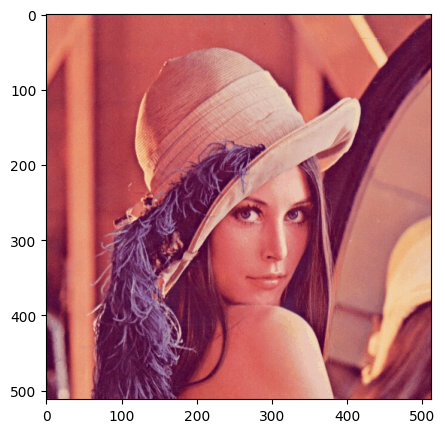

In [ ]:
image = Image.open('lena_color.jpg') #using pillow: path of the image/file name if it is in the same folder = load img.
print(type(image)) #type of the image object
im = np.asarray(image,dtype=np.uint8) #convert to numpy array/matrix with uint8 data type
print(type(im))
plt.imshow(im)
plt.show()

<class 'PIL.JpegImagePlugin.JpegImageFile'>
<class 'numpy.ndarray'>


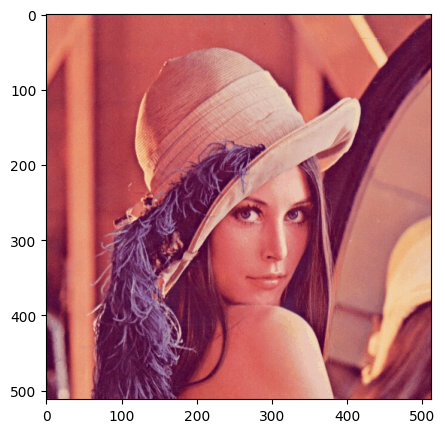

In [ ]:
# Commented out redundant code below (imports already done above)

import os  # provides functions for path and file handling (e.g., joining, checking, listing directories)
import numpy as np  # converts images to arrays/matrices and allows array/matrix operations
from PIL import Image  # Pillow library to handle images: open, edit, and change color space
import matplotlib.pyplot as plt  # used to display images or plots
import matplotlib  # base Matplotlib library used to set global display parameters
matplotlib.rcParams['figure.figsize'] = [5, 5]  # sets the default figure size for all plots to 5x5 inches

from PIL import Image       # imports the Pillow library used for opening and processing image files
import numpy as np          # imports NumPy for numerical and matrix operations
import matplotlib.pyplot as plt  # imports Matplotlib (pyplot) to visualize or display images

image = Image.open('lena_color.jpg')   # opens the specified image file and loads it as a PIL Image object
print(type(image))                     # prints the data type of 'image' (PIL image object)

im = np.asarray(image, dtype=np.uint8) # converts the PIL image into a NumPy array (each pixel as numeric RGB values)
print(type(im))                        # prints the data type of 'im' (NumPy array)

plt.imshow(im)     # plots the image data on a Matplotlib figure (displays pixels as colors)
plt.show()         # shows the plotted image in a separate window or inline (depending on environment)


## Using OpenCV

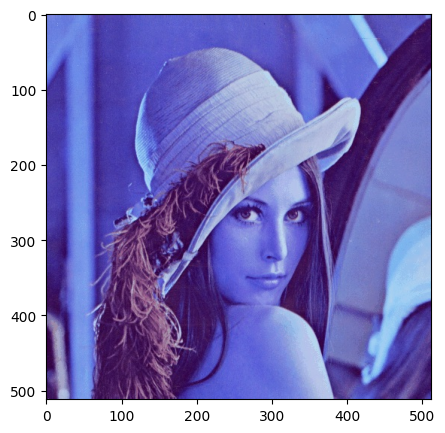

In [ ]:
import cv2
input_image=cv2.imread('lena_color.jpg') #read image using OpenCV, name/or path of the image
plt.imshow(input_image)

#RGB to BGR conversion, because OpenCV uses BGR format by default.
#That is why the colors may appear incorrect when displaying images read with OpenCV using Matplotlib, which expects RGB format.
#The color will be "blueish" instead of "reddish".

## Why OpenCV display "Avatar-like" picture?

OpenCV, by default, read image using BGR color space instead of RGB (Red-Green-Blue). If you need RGB:

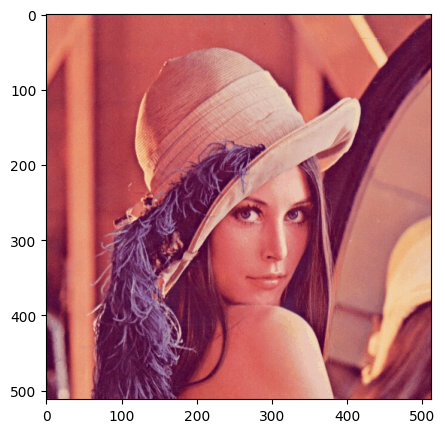

In [15]:
# split channels
b,g,r=cv2.split(input_image)
merged=cv2.merge([r,g,b])
# merge takes an array of single channel matrices
plt.imshow(merged)

### OR

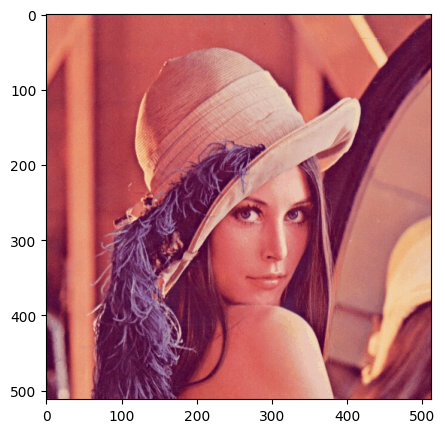

In [16]:
plt.imshow(cv2.cvtColor(input_image,cv2.COLOR_BGR2RGB))

## RGB Color Space

RGB color space has *3* color channels: Red, Green, Blue.

The RGB color space is the most common one, as used by many (or all) camera devices during the camera acquisition process.

Specifically, RGB is a consequence of the Color Filter Array (CFA). This latter implement a *Bayer filter*, place over the sensor, aimed at capturing red, green and blue light (all characterized by different wavelength). Filters devoted at capturing green light are twice as many as red and blue. 

*WHY?* Take note. Human vision has more Green cells.

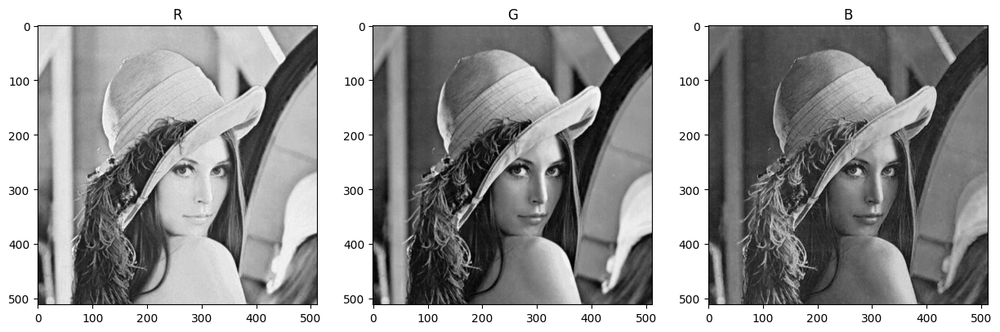

In [18]:
# Plot the 3 separate components
# Pay attention, in openCV images use BGR istead of RGB
matplotlib.rcParams['figure.figsize'] = [15, 15]

plt.subplot(131)
plt.title('R')
plt.imshow(im[:,:,0],cmap='gray')
plt.subplot(132)
plt.title('G')
plt.imshow(im[:,:,1],cmap='gray')
plt.subplot(133)
plt.title('B')
plt.imshow(im[:,:,2],cmap='gray')
plt.show()

## YCbCr Color Space

Not always is convient to work on RGB Images.

YCbCr color space, split the image into three color channels: Y (Luminance), Cb (Chrominance Blue), Cr (Chrominance Red).

The luminance Y is derived as the weighted sum of the RGB components to match human's brightness perception.

The Chrominance Blue (Cb), is the difference between the blue component (B) and Y. Cr, is the same but with R.

YCbCr color space is very useful when it is necessary to compress, brodcast or process an image avoiding losing image quality (i.e. JPEG compression)

*QUESTION*: what component(s) is better process to avoid image quality loss when using YCbCr? Luminance (Y) must be avoided.

### Convert into YCbCr color space

<class 'PIL.Image.Image'>
<class 'numpy.ndarray'>


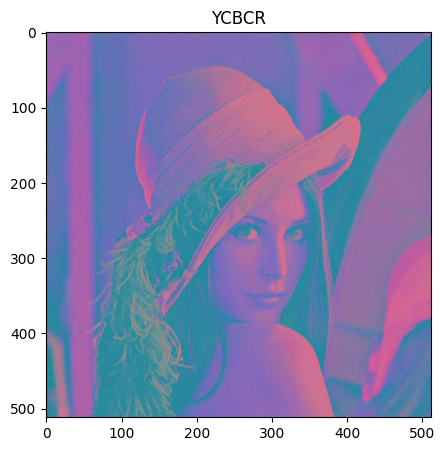

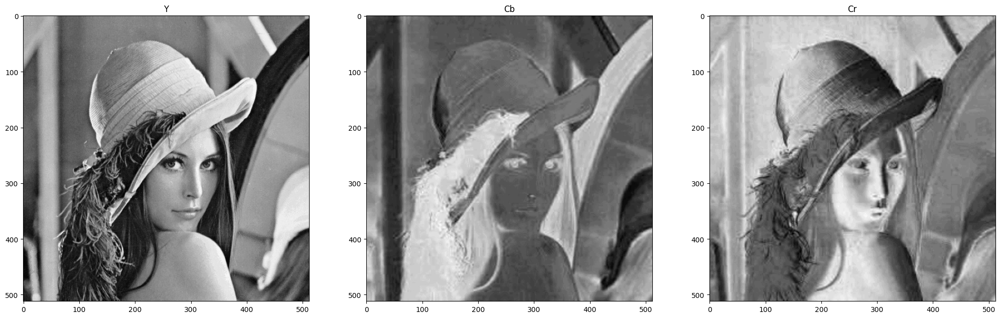

In [20]:
transformed = image.convert('YCbCr')
print(type(transformed))
ycbcr = np.asarray(transformed,dtype=np.uint8)
print(type(ycbcr))
matplotlib.rcParams['figure.figsize'] = [5, 5]

# We cast the transformed values in 3x8 bits per pixel to allow visualization
plt.title('YCBCR')
plt.imshow(ycbcr)
plt.show()

matplotlib.rcParams['figure.figsize'] = [25, 25]

# Plot the 3 separate components
plt.subplot(131)
plt.title('Y')
plt.imshow(ycbcr[:,:,0],cmap='gray')
plt.subplot(132)
plt.title('Cb')
plt.imshow(ycbcr[:,:,1],cmap='gray')
plt.subplot(133)
plt.title('Cr')
plt.imshow(ycbcr[:,:,2],cmap='gray')
plt.show()

Save a transformed image as JPEG

In [ ]:
#How to store the transformed image into a jpg file after processing (e.g. the color space conversion) 
res = Image.fromarray(ycbcr)
res.save('transformed.jpg')

*Process and then Visualize* the consequence of image processing applied to the Y,Cb, Cr component

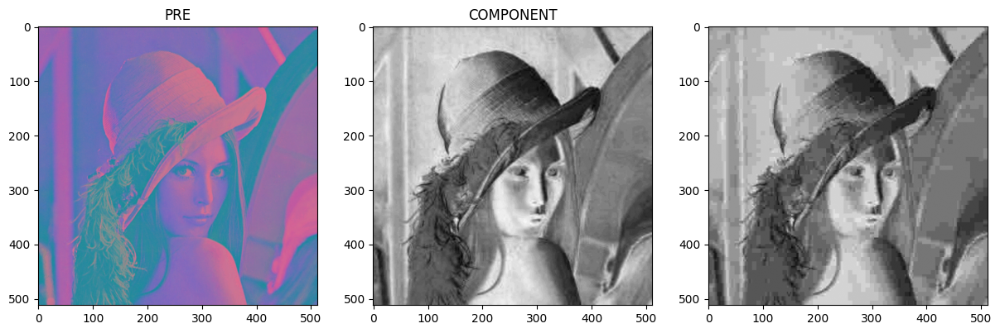

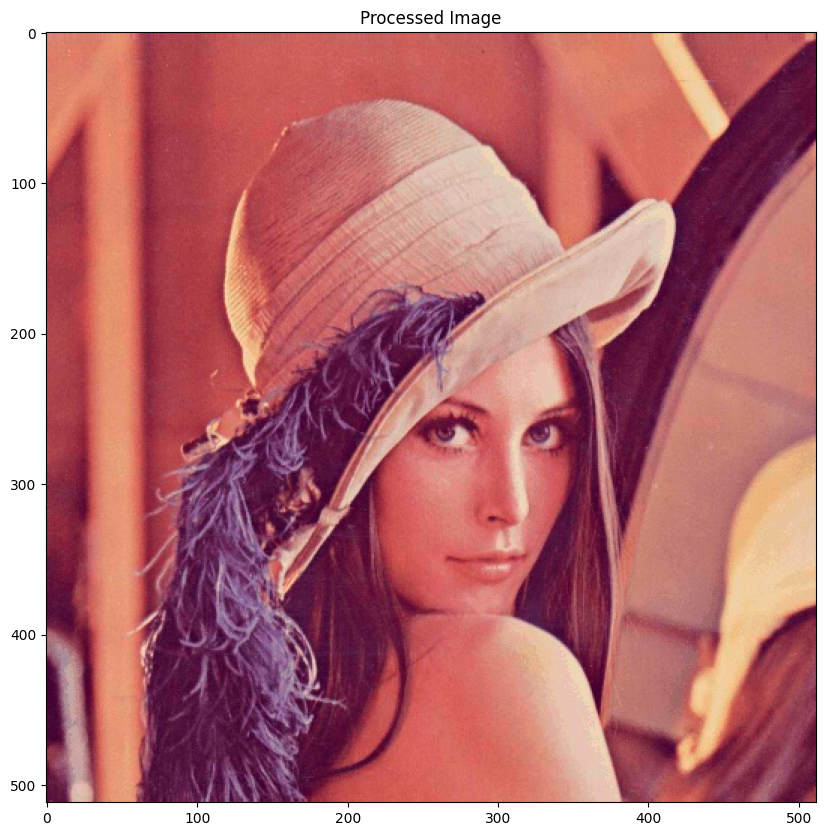

In [ ]:
def jpeg_compression(img, QF):
  from PIL import Image
  img = Image.fromarray(img)
  img.save('tmp.jpg',"JPEG", quality=QF)
  attacked = Image.open('tmp.jpg')
  attacked = np.asarray(attacked,dtype=np.uint8)
  os.remove('tmp.jpg')

  return attacked



transformed = image.convert('YCbCr')
ycbcr = np.asarray(transformed,dtype=np.uint8)
y = ycbcr[:,:,0]
cb =  ycbcr[:,:,1]
cr = ycbcr[:,:,2]
matplotlib.rcParams['figure.figsize'] = [20, 20]

#choose the ycbcr component
# idx = 0  #0=luminance, 1=chrominance blue, 2=chrominance red  #if 0=luminance, and the quality won't be good, because luminance is the most important component
idx = 2  #0=luminance, 1=chrominance blue, 2=chrominance red

component = ycbcr[:,:,idx]
plt.subplot(141)
plt.title('PRE')
plt.imshow(ycbcr)

plt.subplot(142)
plt.title('COMPONENT')
plt.imshow(component,cmap='gray')

plt.subplot(143)
compressed = jpeg_compression(component, 25) #compress the selected component it is to lossy, QF=25
plt.imshow(compressed,cmap='gray')
component = compressed
plt.show()
matplotlib.rcParams['figure.figsize'] = [10, 10]

plt.title('Processed Image')
if idx == 0 :
    proc_image = (cv2.merge([component, cr, cb]))
    proc_image= cv2.cvtColor(proc_image, cv2.COLOR_YCrCb2RGB)
    plt.imshow(proc_image)
elif idx == 1:
     proc_image = (cv2.merge([y, cr, component]))
     proc_image= cv2.cvtColor(proc_image, cv2.COLOR_YCrCb2RGB)
     plt.imshow(proc_image)
elif idx == 2:
     proc_image = (cv2.merge([y, component, cb]))
     proc_image= cv2.cvtColor(proc_image, cv2.COLOR_YCrCb2RGB)
     plt.imshow(proc_image)

plt.show()



### Additional YCbCr Image Processings

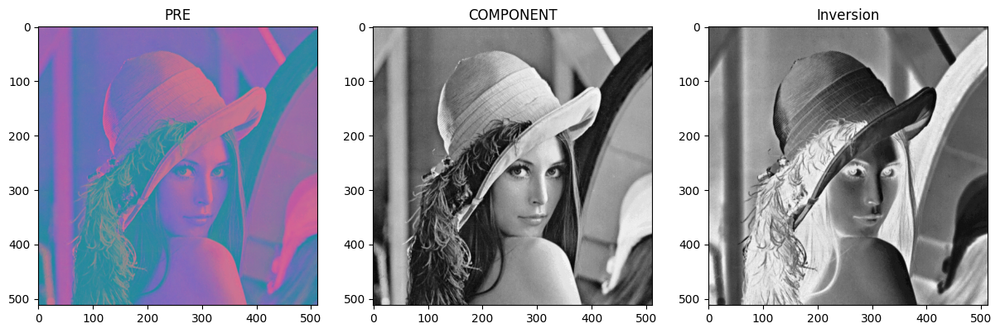

In [ ]:
transformed = image.convert('YCbCr')

matplotlib.rcParams['figure.figsize'] = [20, 20]

#choose the ycbcr component
idx = 0  #0=luminance, 1=chrominance blue, 2=chrominance red

component = ycbcr[:,:,idx] 
plt.subplot(141)
plt.title('PRE')
plt.imshow(ycbcr)

plt.subplot(142)
plt.title('COMPONENT')
plt.imshow(component,cmap='gray')

#Color inversion = an inversion of the pixel values in selected color spaces
plt.subplot(143)
plt.title('Inversion')
plt.imshow(255-component,cmap='gray')

#Brightness adjustment = use in the Luminance channel to adjset brightness levels of the pixel and recunstruct the image (see what happens)
# plt.subplot(143)
# plt.title('Brightness adjustment')
# plt.imshow(np.asarray(component+30,np.uint8),cmap='gray')

#Gamma correction = used to assure that brightness level are percieved accurately to our human visual system
#plt.subplot(143)
#plt.title('Gamma correction') #used to assure that brightness level are percieved accurately 
#yg = np.asarray(255 * (component/255)**1.2,np.uint8)
#plt.imshow(yg,cmap='gray')


## Masking Operations

(512, 512, 3)
(512, 512, 3)


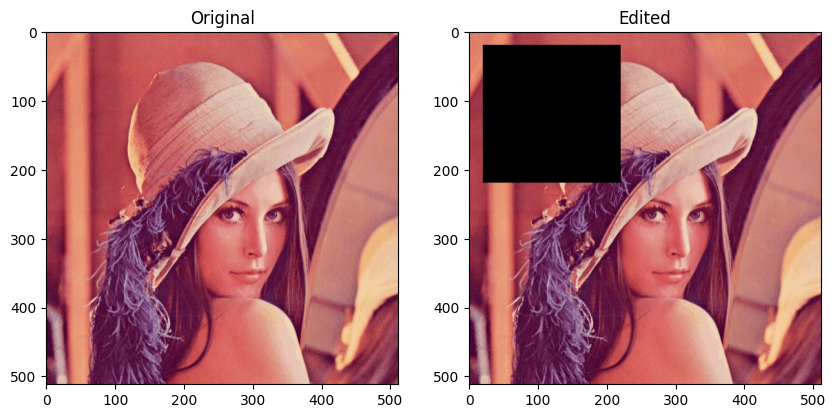

In [51]:
#Can be used when we implement the attack  # (note: this is a descriptive remark, not executable)
#Substitute the pixels with the neighboring pixels could be one option for the attack.


#Masking attack example: masking an entire object or area in the image
print(im.shape)  # print the NumPy array shape (height, width, channels)

edited = np.copy(im) #make a copy of the original image to edit  # create an independent copy so original stays unchanged
print(edited.shape)  # confirm the copied image has the same shape

edited[20:220, 20:220, :] = 0 #A set of index for each color channel 20 starting 200 anding, firts couple the y-axis and the second x-axis
# sets the pixel block from rows 20..219 and cols 20..219 to black for all color channels (creates a 200x200 mask)

matplotlib.rcParams['figure.figsize'] = [10, 10]  # set the default figure size for plotting to 10x10 inches

# Show orginal and edited images side by side
plt.subplot(121)  # create a subplot grid 1x2 and select the 1st cell (left)
plt.title('Original')  # title for the first subplot
plt.imshow(image)  # display the original image (PIL Image or array accepted)
plt.subplot(122)  # select the 2nd cell (right) in the 1x2 grid
plt.title('Edited')  # title for the second subplot
plt.imshow(edited)  # display the edited (masked) image
plt.show()  # render and display the figure with both subplots


## Cropping and Slicing

Allow to crop or slice specific regions of an image.

(190, 280, 3)


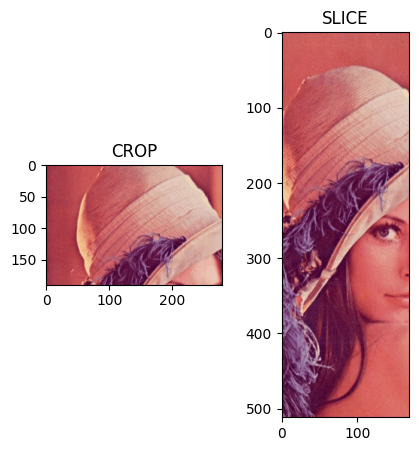

In [38]:
#Crop
matplotlib.rcParams['figure.figsize'] = [5, 5]
plt.subplot(121)
hat = im[60:250, 70:350]
plt.title('CROP')
plt.imshow(hat)
print(hat.shape)

#Slice
plt.subplot(122)
plt.title('SLICE')
crop = im[:, 130:300] 
plt.imshow(crop)
plt.show()


## Image Composition

Splice image crops

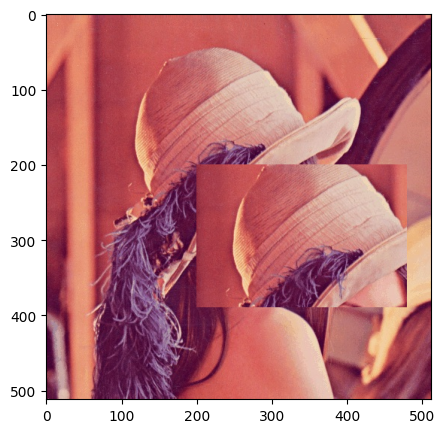

In [13]:
fresh_image=cv2.cvtColor(cv2.imread('lena_color.jpg'),cv2.COLOR_BGR2RGB) # it's either start with a fresh read of the image, 
                                  # or end up with hats on hats on hats 
                                   # as you re-run parts of the notebook but not others...                       
fresh_image[200:200+hat.shape[0], 200:200+hat.shape[1]]=hat

plt.imshow(fresh_image)

## Rotation, Flip and Basic Operations

Rotate, Flip and find the min or max of an image in each of its color channel using ```cv2.minMaxLoc```.

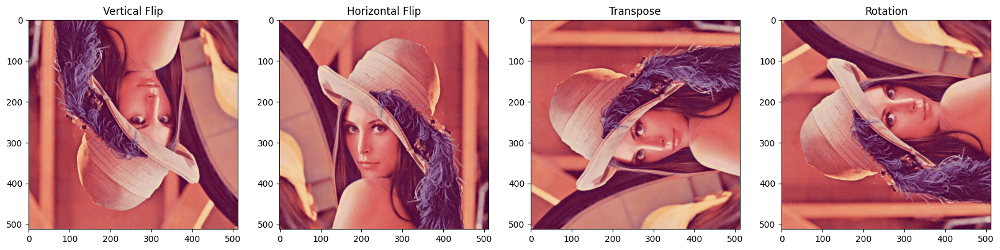

min 28.0 is at (269, 255), and max 216.0 is at (114, 369)
min 0.0 is at (511, 66), and max 223.0 is at (321, 115)
min 52.0 is at (266, 198), and max 255.0 is at (15, 12)


In [52]:
matplotlib.rcParams['figure.figsize'] = [20, 20]

flipped_code_0=cv2.flip(input_image,0) # vertical flip
plt.subplot(141)
plt.title('Vertical Flip')
plt.imshow(cv2.cvtColor(flipped_code_0, cv2.COLOR_BGR2RGB))

plt.subplot(142)
plt.title('Horizontal Flip')
flipped_code_1=cv2.flip(input_image,1) # horizontal flip
plt.imshow(cv2.cvtColor(flipped_code_1, cv2.COLOR_BGR2RGB))

plt.subplot(143)
plt.title('Transpose')
transposed=cv2.transpose(input_image)
plt.imshow(cv2.cvtColor(transposed, cv2.COLOR_BGR2RGB))

plt.subplot(144)
plt.title('Rotation')
rotated=cv2.rotate(input_image, 2)
plt.imshow(cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB))
plt.show()

for i in range(0,3):
   min_value, max_value, min_location, max_location=cv2.minMaxLoc(input_image[:,:,i])
   print("min {} is at {}, and max {} is at {}".format(min_value, min_location, max_value, max_location))

## Edge Dection

For a lot of time "modern" computer vision techniques were based on edge detection functions as a building block. Much edge detection actually works by **convolution**, and indeed **convolutional neural networks** are absolutely the flavour of the month in some parts of computer vision. Sobel's edge detector was one of the first truly successful edge detection (enhancement) technique and that involves convolution at its core. You can read more about the background to Sobel here in the OpenCV docs [here](https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_imgproc/py_gradients/py_gradients.html). 

Edge Detection techniques permit to detect and spot suitable position to embed your watermark. As we will learn, edges often corresponds to textures, textures corresponds to high frequencies and... high frequencies to (TAKE NOTE).

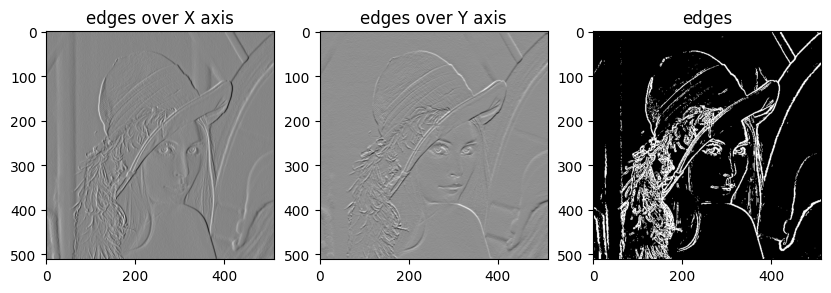

In [53]:
sobelimage=cv2.cvtColor(input_image,cv2.COLOR_BGR2GRAY)
matplotlib.rcParams['figure.figsize'] = [10, 10]


sobelx = cv2.Sobel(sobelimage,cv2.CV_64F,1,0,ksize=3)
sobely = cv2.Sobel(sobelimage,cv2.CV_64F,0,1,ksize=3)
plt.subplot(131)
plt.title('edges over X axis')
plt.imshow(sobelx,cmap = 'gray')
plt.subplot(132)
plt.title('edges over Y axis')
plt.imshow(sobely,cmap = 'gray') 

# Compute the gradient magnitude
magnitude = np.sqrt(sobelx**2 + sobely**2)

# Optionally, scale to 8-bit to display
magnitude = cv2.convertScaleAbs(magnitude)
# Threshold the magnitude image
_, thresholded = cv2.threshold(magnitude, 100, 255, cv2.THRESH_BINARY)
plt.subplot(133)
plt.title('edges')
plt.imshow(thresholded,cmap = 'gray')


### Canny Edge Detection

Canny edge detection is another winning technique - it takes two thresholds.
The first one determines how likely Canny is to find an edge, and the second determines how likely it is to follow that edge once it's found. Investigate the effect of these thresholds by changing the values below.

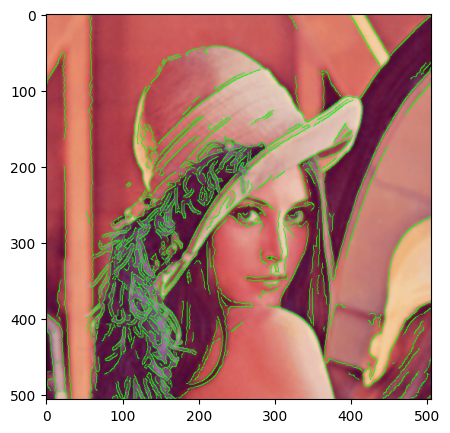

In [16]:
th1=30
th2=60 # Canny recommends threshold 2 is 3 times threshold 1 - you could try experimenting with this...
d=3 # gaussian blur
matplotlib.rcParams['figure.figsize'] = [5, 5]

edgeresult=input_image.copy()
edgeresult = cv2.GaussianBlur(edgeresult, (2*d+1, 2*d+1), -1)[d:-d,d:-d]

gray = cv2.cvtColor(edgeresult, cv2.COLOR_BGR2GRAY)

edge = cv2.Canny(gray, th1, th2)

edgeresult[edge != 0] = (0, 255, 0) # this takes pixels in edgeresult where edge non-zero colours them bright green

plt.imshow(cv2.cvtColor(edgeresult, cv2.COLOR_BGR2RGB))

# Image processing

In this section we see the image processings you are allowed to use for the challenge!


In [54]:
original = Image.open('lena_color.jpg')
original = np.asarray(original,dtype=np.uint8)
print('Image shape: ', original.shape)

Image shape:  (512, 512, 3)


## AWGN

Applied localy or globaly. Be aware, globaly only on textured images not on flat ones like Lena's.


AWGN (Additive White Gaussian Noise), as the name suggests, is used to add a normally distributed noise to a signal, in our case an image.

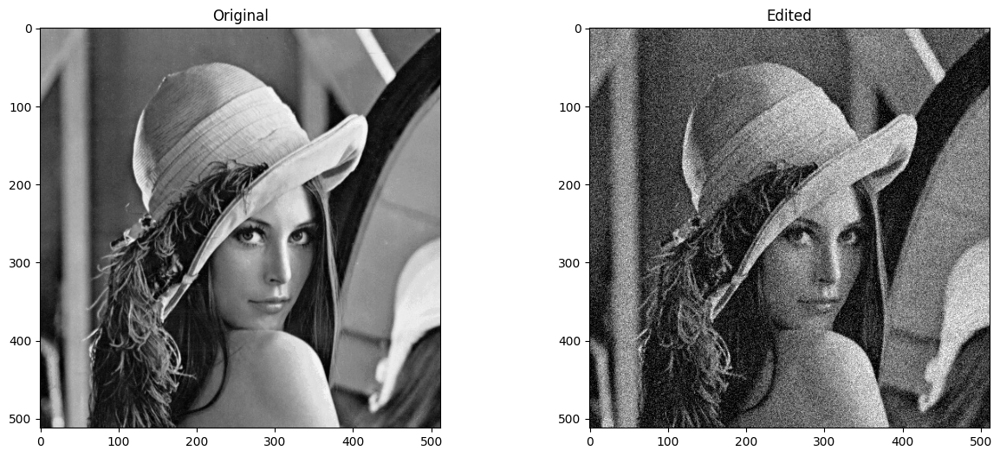

In [57]:
def awgn(img, std, seed): #img, stanrdadegation, seed value is random.
  mean = 0.0   # some constant
  np.random.seed(seed)
  attacked = img + np.random.normal(mean, std, img.shape)
  attacked = np.clip(attacked, 0, 255)
  return attacked

attacked = awgn(original[:,:,1], 30.0, 123)

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Original')
plt.imshow(original[:,:,1], cmap='gray')
plt.subplot(122)
plt.title('Edited')
plt.imshow(attacked, cmap='gray')
plt.show()

## Blurring through GAUSSIAN FILTER

The Gaussian Filter is used to "remove" or attenute high-frequencies information contained in images related to textures and noise like AWGN.

After appling AWGN we can use it to "recover" the quality.

The filter applies a Gaussian function to image (or single image channel/components) weighting the values of neighboring pixels based on their distance from the central point (more weight to nearby points and less weight to distant points).

Basically, it smooth your image.

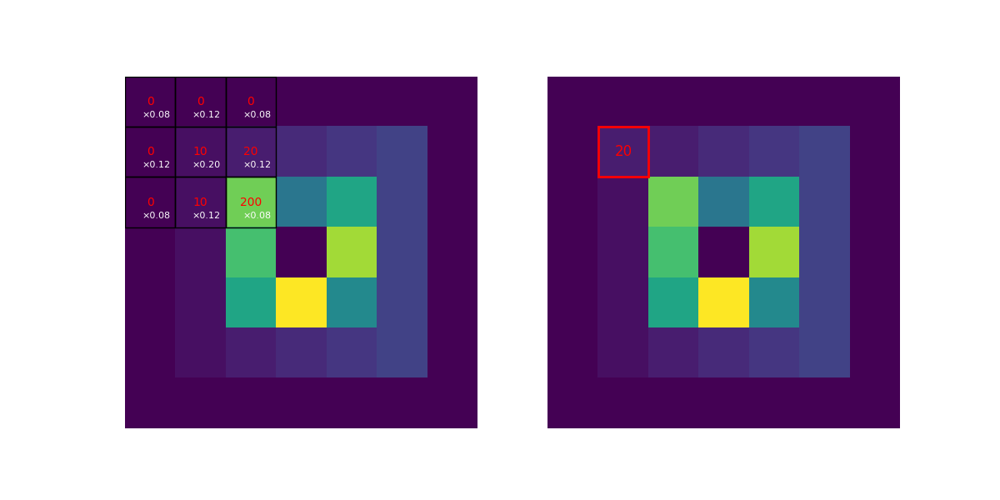

When could it be useful in your watermarking challenge? (TAKE NOTE)


The standard deviations (sigma) of the Gaussian filter, which affects the strenght of the filter, can be an integer or a list of two integers. [check this](https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.gaussian_filter.html)


C:\Users\tamas\AppData\Local\Temp\ipykernel_11896\1288058121.py:2: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter


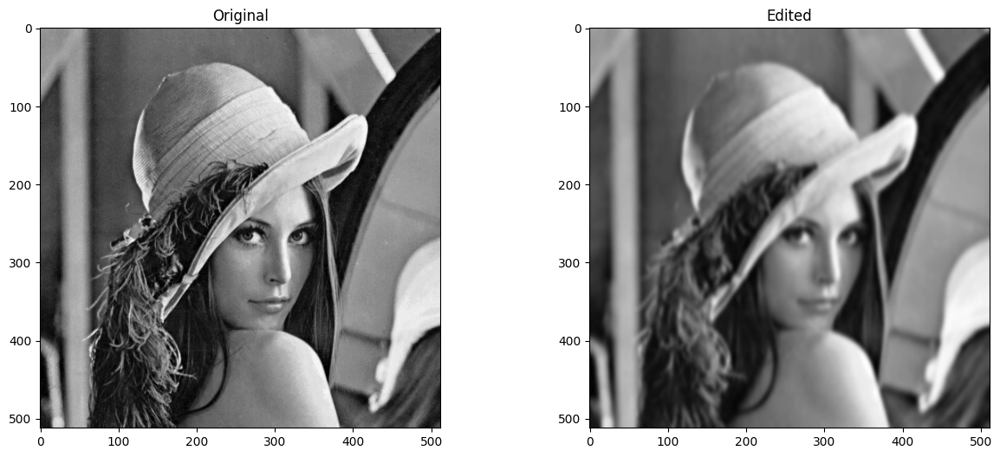

In [ ]:
#Affected the texture 
#It can be used to remove the wattermark embedded on the high frequency

def blur(img, sigma):
  from scipy.ndimage.filters import gaussian_filter
  attacked = gaussian_filter(img, sigma)
  return attacked

attacked = blur(original[:,:,1], [3, 2])

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Original')
plt.imshow(original[:,:,1], cmap='gray')
plt.subplot(122)
plt.title('Edited')
plt.imshow(attacked, cmap='gray')
plt.show()

## Sharpening

The sharpening filter is the inverse of blurring. It is used to enhance details in an image by exaggerating the brightness difference along edges within an image.

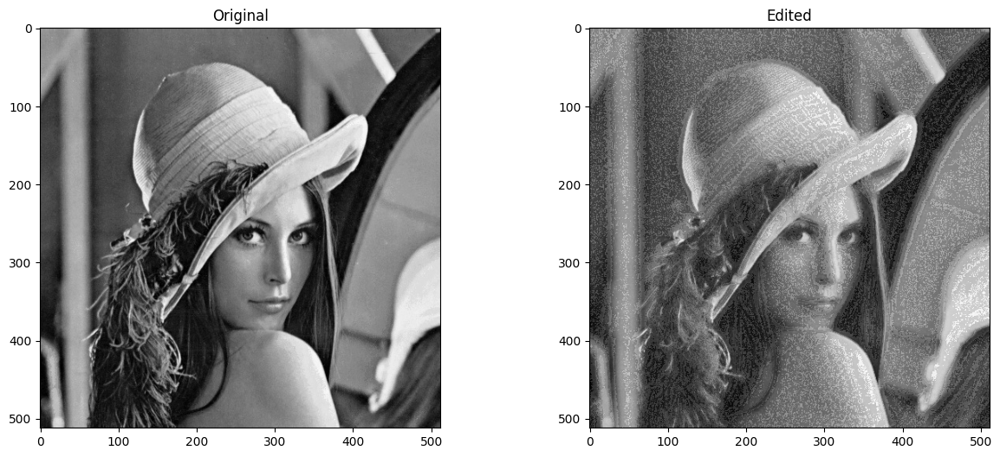

In [ ]:
#The invers of the blur (gaussian filter)
#It can be used to remove the wattermark embedded on the mid frequency

def sharpening(img, sigma, alpha):
  import scipy
  from scipy.ndimage import gaussian_filter
  import matplotlib.pyplot as plt

  #print(img/255)
  filter_blurred_f = gaussian_filter(img, sigma)

  attacked = img + alpha * (img - filter_blurred_f)
  return attacked


attacked = sharpening(original[:,:,1], 3, 0.2)

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Original')
plt.imshow(original[:,:,1], cmap='gray')
plt.subplot(122)
plt.title('Edited')
plt.imshow(attacked, cmap='gray')
plt.show()

## Median filtering

The median filter is a digital filtering technique often used to remove noise from an image PRESERVING EDGES. It is very effective on salt and pepper noise while is less effective on others like Canny Edge detection. It use convolutional operations similar to the Gaussian Filter (blur), but implement a different kernel. Also useful during edge detection operation.


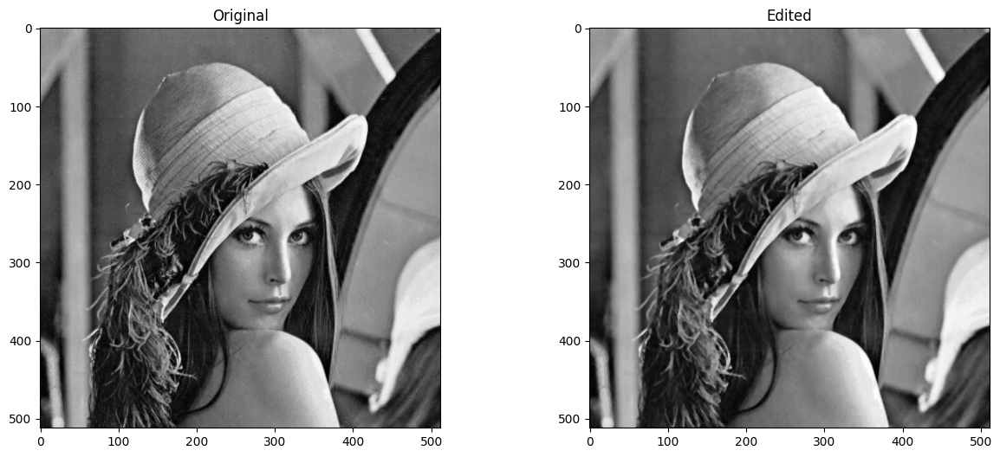

In [62]:
def median(img, kernel_size):
  from scipy.signal import medfilt
  attacked = medfilt(img, kernel_size)
  return attacked

attacked = median(original[:,:,1], [3, 3])

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Original')
plt.imshow(original[:,:,1], cmap='gray')
plt.subplot(122)
plt.title('Edited')
plt.imshow(attacked, cmap='gray')
plt.show()

## RESIZING (useful when combined with YCBCR transformation)

Prof. transform in YCBCR, than downscale CB and CR channel and this will help removing the watermark.

Resizing is a common operation that can be performed on images.

When an image is downscaled and then upscaled, some information will be lost (similarly to low-pass filtering but avoiding blurring effects) as the final image willcontain less pixels.

In fact, when upscaled the values of the new pixels are estimated using interpolation.
 

(512, 512)


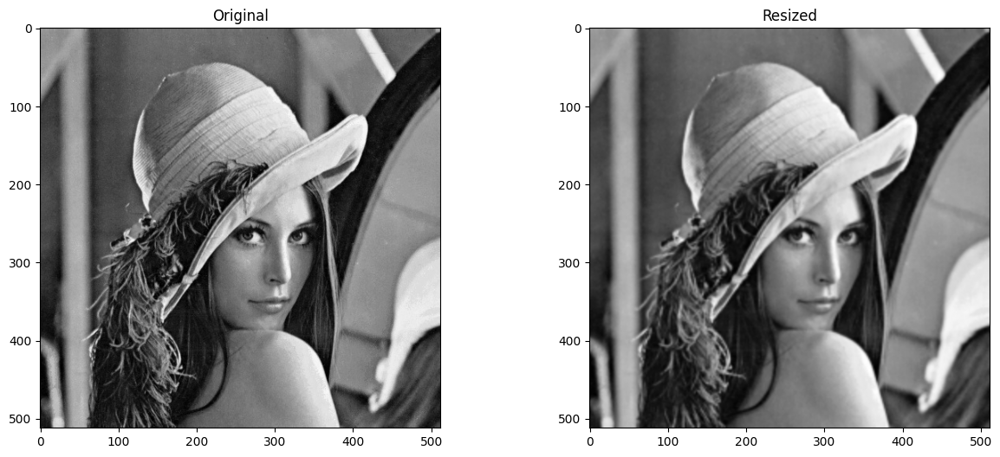

In [63]:
def resizing(img, scale):
  from skimage.transform import rescale
  x, y = img.shape
  attacked = rescale(img, scale)
  attacked = rescale(attacked, 1/scale)
  attacked = attacked[:x, :y]
  return attacked

attacked = resizing(original[:,:,1], 0.5)
print(np.shape(attacked))

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Original')
plt.imshow(original[:,:,1], cmap='gray')
plt.subplot(122)
plt.title('Resized')
plt.imshow(attacked, cmap='gray')
plt.show()

## JPEG Compression

Images require a lot of bandwidth and storage capacity. Compression is aimed at reducing the amount of data to be transmitted. One of the main standards is JPEG.

The JPEG is a lossy scheme, i.e. some information is lost during the process.
By increasing the compression rate, artifacts appear: blocking, blurring, chromatic aberrations.

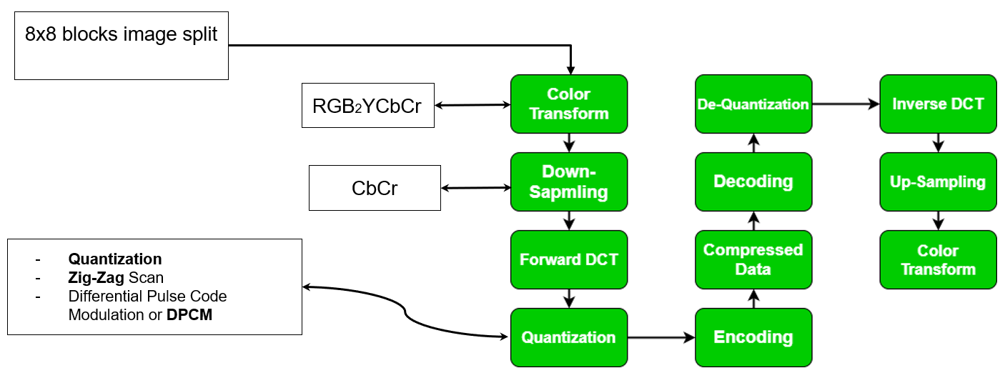


In Python we can specify the Quality Factor (QF $\in$ [0, 100]$). They lower the QF the higher the compression rate. 



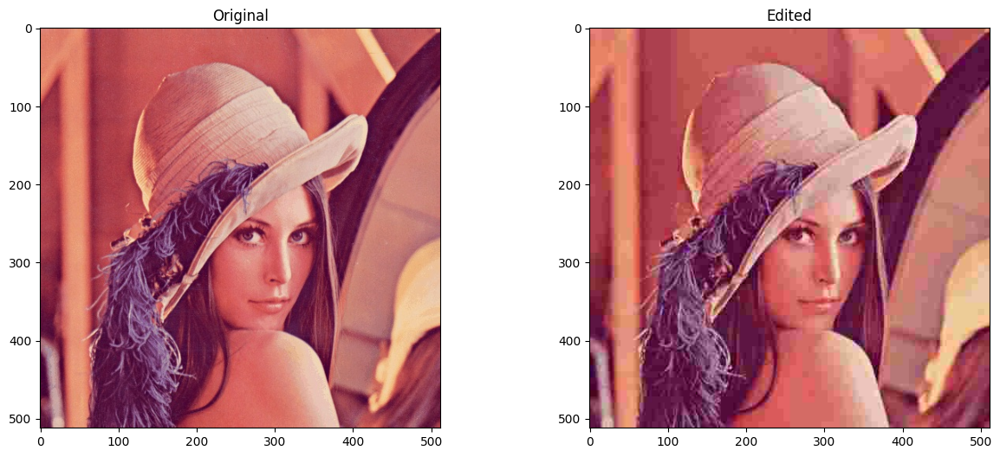

In [ ]:
def jpeg_compression(img, QF): #0 to 100, the higher the better quality. Do not use 0.
  from PIL import Image
  img = Image.fromarray(img)
  img.save('tmp.jpg',"JPEG", quality=QF)
  attacked = Image.open('tmp.jpg')
  attacked = np.asarray(attacked,dtype=np.uint8)
  os.remove('tmp.jpg')

  return attacked

attacked = jpeg_compression(original, 10) #compress the selected component it is to lossy, QF=25

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Original')
plt.imshow(original, cmap='gray')
plt.subplot(122)
plt.title('Edited')
plt.imshow(attacked, cmap='gray')
plt.show()